In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import math

In [2]:
pd.options.display.max_columns = 150
df=pd.read_csv(r"C:\Users\vamsi\Desktop\Interview\Music_Data.csv")
df.drop(columns=['Unnamed: 0','key','duration_in min/ms'],inplace=True)
df.head()

,Popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,60.0,0.854,0.564,-4.964,0.0485,0.017100,NaN,0.0849,0.8990,134.071
1,54.0,0.382,0.814,-7.230,0.0406,0.001100,0.004010,0.1010,0.5690,116.454
2,35.0,0.434,0.614,-8.334,0.0525,0.486000,0.000196,0.3940,0.7870,147.681
3,66.0,0.853,0.597,-6.528,0.0555,0.021200,NaN,0.1220,0.5690,107.033
4,53.0,0.167,0.975,-4.279,0.2160,0.000169,0.016100,0.1720,0.0918,199.060


In [3]:
df.columns

Index(['Popularity', 'danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17996 entries, 0 to 17995
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Popularity        17568 non-null  float64
 1   danceability      17996 non-null  float64
 2   energy            17996 non-null  float64
 3   loudness          17996 non-null  float64
 4   speechiness       17996 non-null  float64
 5   acousticness      17996 non-null  float64
 6   instrumentalness  13619 non-null  float64
 7   liveness          17996 non-null  float64
 8   valence           17996 non-null  float64
 9   tempo             17996 non-null  float64
dtypes: float64(10)
memory usage: 1.4 MB


In [8]:
print('Is there any missing value? ', 'Yes')
print('How many missing values? ', 647)
df.dropna(inplace=True)
print('Number of participants after eliminating missing values: ', 17996-647)

Is there any missing value?  Yes
How many missing values?  647
Number of participants after eliminating missing values:  17349


In [6]:
df.head()

,Popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
1,54.0,0.382,0.814,-7.230,0.0406,0.001100,0.004010,0.1010,0.5690,116.454
2,35.0,0.434,0.614,-8.334,0.0525,0.486000,0.000196,0.3940,0.7870,147.681
4,53.0,0.167,0.975,-4.279,0.2160,0.000169,0.016100,0.1720,0.0918,199.060
5,53.0,0.235,0.977,0.878,0.1070,0.003530,0.006040,0.1720,0.2410,152.952
6,48.0,0.674,0.658,-9.647,0.1040,0.404000,0.000001,0.0981,0.6770,143.292


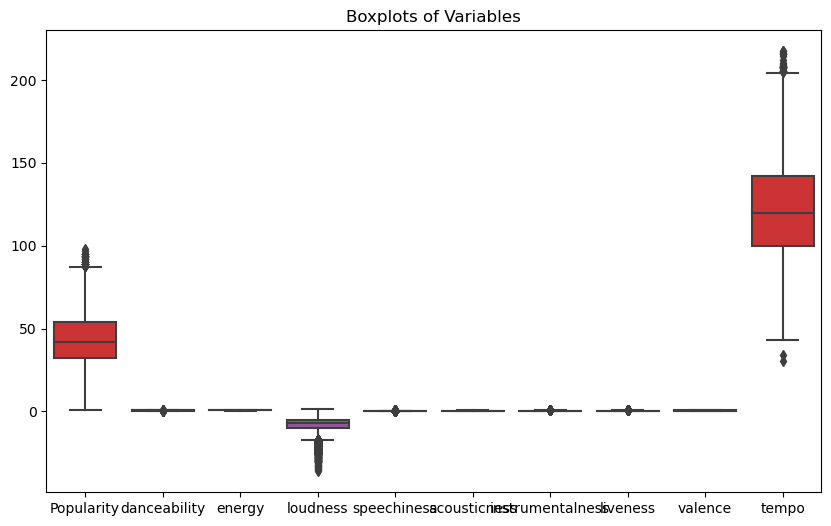

In [7]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, palette="Set1")
plt.title('Boxplots of Variables')
plt.show()

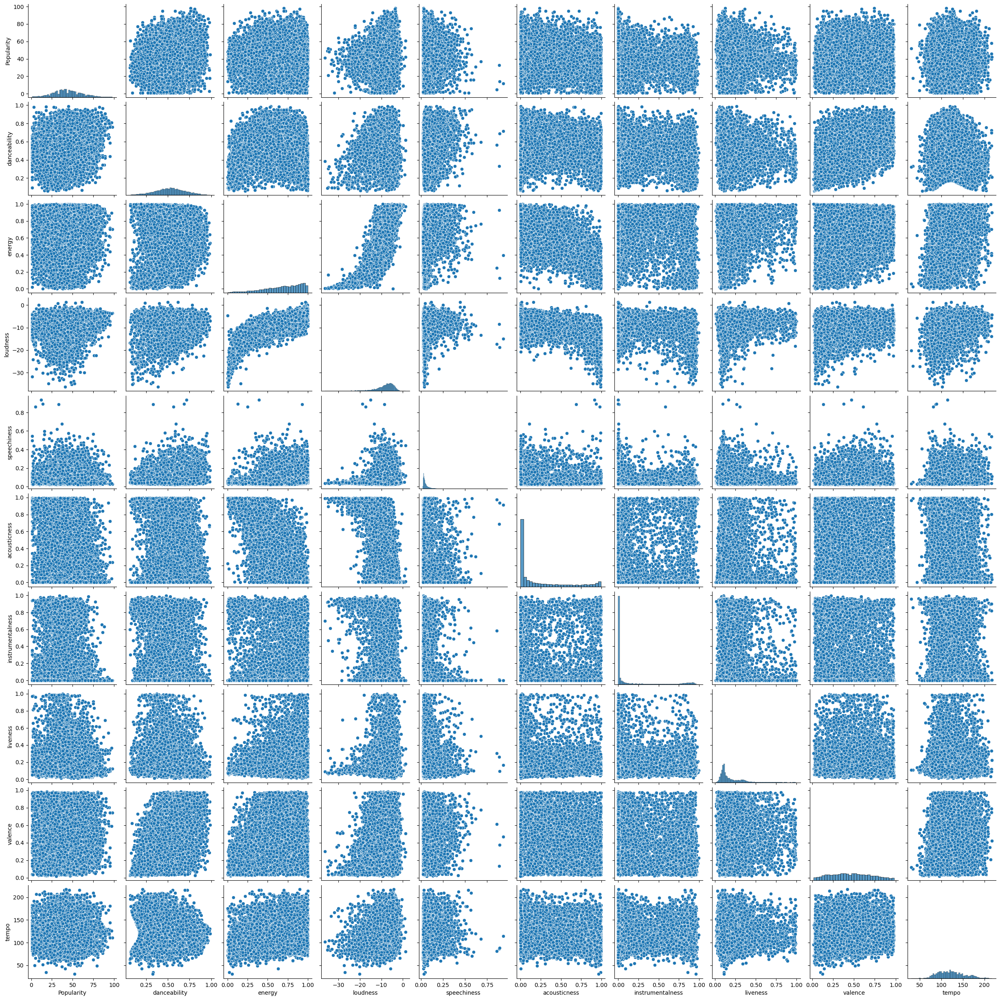

In [8]:
sns.pairplot(df)
plt.show()

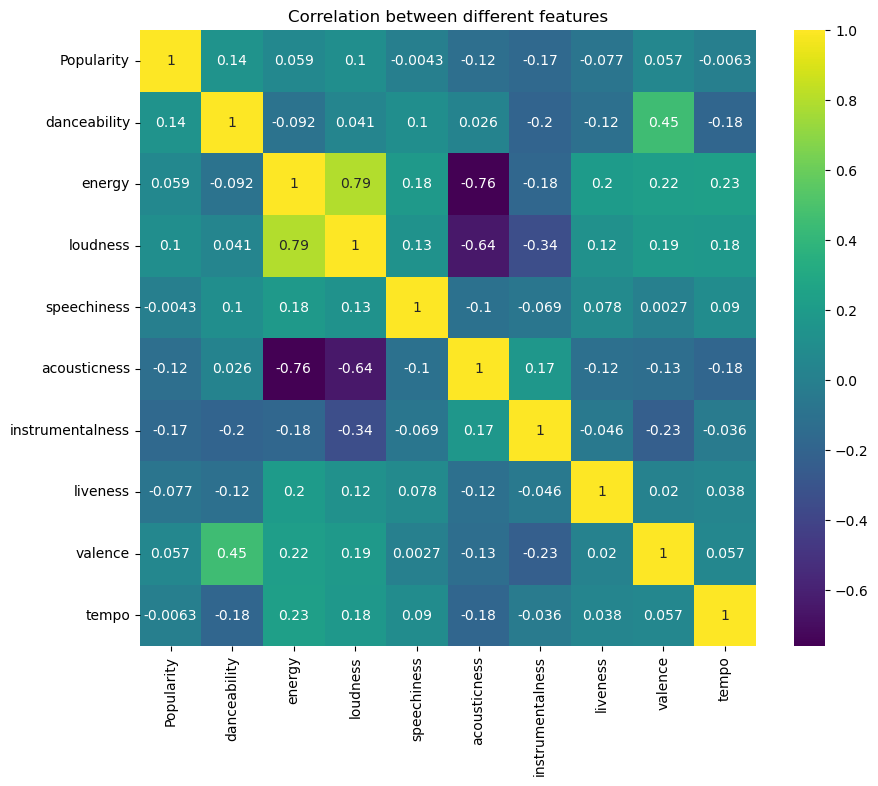

In [9]:
corr=df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), vmax=1, square=True, annot=True, cmap='viridis')
plt.title('Correlation between different features')
plt.show()

In [10]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

In [11]:
scaler = StandardScaler()
data = pd.DataFrame(scaler.fit_transform(df))

In [12]:
data.head()

,0,1,2,3,4,5,6,7,8,9
0,0.654321,-0.862484,0.605118,0.237910,-0.441500,-0.755394,-0.571462,-0.586661,0.394236,-0.219463
1,-0.487478,-0.549795,-0.216884,-0.020874,-0.262977,0.761997,-0.584022,1.224908,1.284120,0.841523
2,0.594227,-2.155330,1.266829,0.929644,2.189834,-0.758308,-0.531648,-0.147680,-1.553711,2.587205
3,0.594227,-1.746430,1.275049,2.138479,0.554627,-0.747790,-0.564777,-0.147680,-0.944671,1.020613
4,0.293753,0.893382,-0.036044,-0.328650,0.509621,0.505395,-0.584663,-0.604591,0.835096,0.692400


## PCA

In [13]:
eigenvalues, eigenvectors = np.linalg.eig(corr)

sorted_indices = np.argsort(eigenvalues)[::-1]  # Sort in descending order
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# Calculate the explained variance ratio
explained_variance_ratio = eigenvalues / np.sum(eigenvalues)

total_variance = np.sum(explained_variance_ratio)
variance_to_retain = 0.90
cumulative_variance = np.cumsum(explained_variance_ratio)

In [14]:
# Create a DataFrame to hold the table
dt = {'Principal Component': ['PC{}'.format(i) for i in range(1, len(eigenvalues) + 1)],
        'Eigenvalues': eigenvalues,
        'Proportion': explained_variance_ratio,
        'Cumulative': cumulative_variance}

df_table = pd.DataFrame(dt)

# Display the table
df_table


,Principal Component,Eigenvalues,Proportion,Cumulative
0,PC1,2.816039,0.281604,0.281604
1,PC2,1.630552,0.163055,0.444659
2,PC3,1.063733,0.106373,0.551032
3,PC4,0.970426,0.097043,0.648075
4,PC5,0.942988,0.094299,0.742374
5,PC6,0.878838,0.087884,0.830258
6,PC7,0.771099,0.077110,0.907368
7,PC8,0.453481,0.045348,0.952716
8,PC9,0.334172,0.033417,0.986133
9,PC10,0.138671,0.013867,1.000000


In [15]:
eigenvalue_diff = abs(np.diff(eigenvalues))
dt['Eigenvalue Difference'] = [np.nan] + eigenvalue_diff.tolist()
df_table = pd.DataFrame(dt)

# Display the table
df_table

,Principal Component,Eigenvalues,Proportion,Cumulative,Eigenvalue Difference
0,PC1,2.816039,0.281604,0.281604,NaN
1,PC2,1.630552,0.163055,0.444659,1.185487
2,PC3,1.063733,0.106373,0.551032,0.566820
3,PC4,0.970426,0.097043,0.648075,0.093307
4,PC5,0.942988,0.094299,0.742374,0.027437
5,PC6,0.878838,0.087884,0.830258,0.064150
6,PC7,0.771099,0.077110,0.907368,0.107739
7,PC8,0.453481,0.045348,0.952716,0.317618
8,PC9,0.334172,0.033417,0.986133,0.119309
9,PC10,0.138671,0.013867,1.000000,0.195502


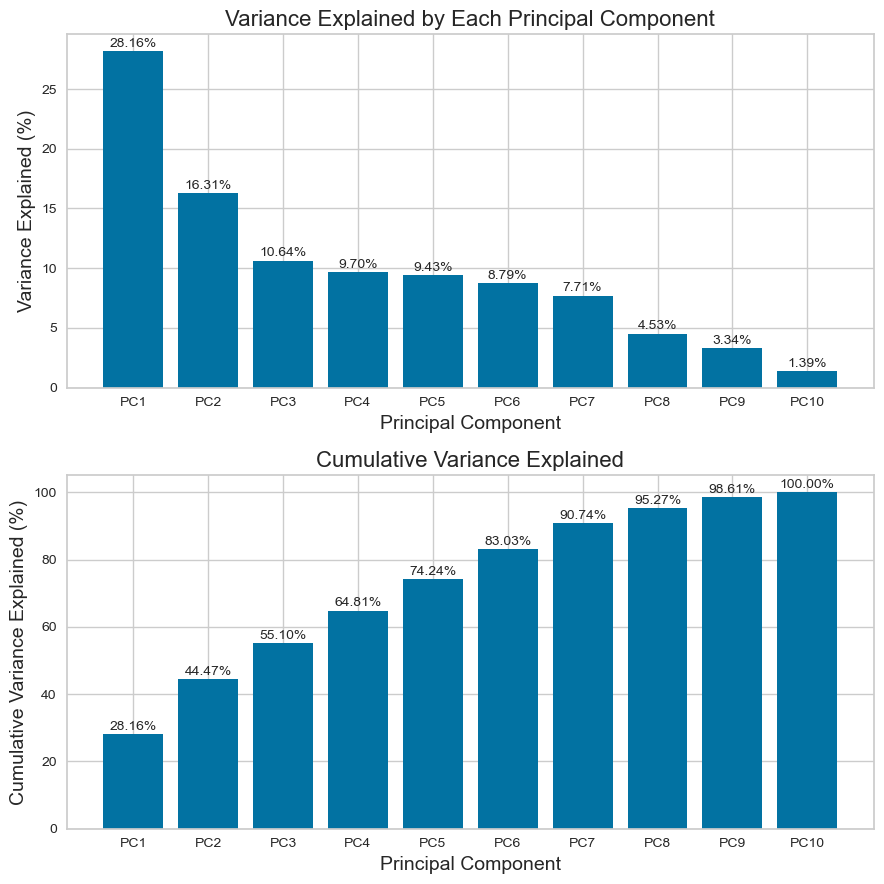

In [16]:
# Labels for the bars
labels = ['PC{}'.format(i) for i in range(1, 11)]

variance_percentage = explained_variance_ratio * 100
cumulative_percentage = np.cumsum(variance_percentage)

# Increase the size of the figure
fig, axs = plt.subplots(2, 1, figsize=(9, 9))

# Create pastel colors for the bars
#pastel_colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#C2C2F0', '#FFDB4D', '#B3B3CC', '#99FFCC', '#FF6666', '#C2F0C2', '#FFB3E6', '#C2F0F0']

# Plot the first bar graph (variance explained)
variance_bars = axs[0].bar(labels, variance_percentage)
axs[0].set_title('Variance Explained by Each Principal Component', fontsize=16)  # Increase title size
axs[0].set_ylabel('Variance Explained (%)', fontsize=14)  # Increase y-label size
axs[0].set_xlabel('Principal Component', fontsize=14)  # Increase x-label size

# Add percentage values on top of the bars
for bar, percentage in zip(variance_bars, variance_percentage):
    height = bar.get_height()
    axs[0].annotate(f'{percentage:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height), xytext=(0, 3), textcoords='offset points', ha='center', fontsize=10)

# Plot the second bar graph (cumulative variance explained)
cumulative_bars = axs[1].bar(labels, cumulative_percentage)
axs[1].set_title('Cumulative Variance Explained', fontsize=16)  # Increase title size
axs[1].set_ylabel('Cumulative Variance Explained (%)', fontsize=14)  # Increase y-label size
axs[1].set_xlabel('Principal Component', fontsize=14)  # Increase x-label size

# Add percentage values on top of the bars
for bar, percentage in zip(cumulative_bars, cumulative_percentage):
    height = bar.get_height()
    axs[1].annotate(f'{percentage:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height), xytext=(0, 3), textcoords='offset points', ha='center', fontsize=10)

# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


In [17]:
# Select the top 'num_components_to_retain' eigenvectors
num_components_to_retain = 7
selected_eigenvectors1 = eigenvectors[:, :num_components_to_retain]
projected_data = np.dot(data, selected_eigenvectors1)

In [18]:
import pandas as pd
import numpy as np
from IPython.display import HTML

# Extract the first six PCs
pcs = projected_data
col=['PC{}'.format(i) for i in range(1, len(pcs[0]) + 1)]
# Create an empty DataFrame to store correlations
correlation_df = pd.DataFrame(columns=col, index=df.columns)

# Calculate correlations for each PC
for i, pc in enumerate(col):
    correlations = np.corrcoef(data.values.T, pcs[:, i])
    correlation_df[pc] = correlations[-1, :-1]  # Extract correlations with X variables

# Create a function to format the DataFrame cell with red text for bold values
def highlight_high_correlations(val):
    color = 'color: red; font-weight: bold' if abs(val) >= 0.5 else ''
    return f'{color}'

# Apply the formatting to the entire DataFrame
styled_correlation_df = correlation_df.style.applymap(highlight_high_correlations)

# Display the styled correlation table
display(styled_correlation_df)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7
Popularity,0.180662,0.333391,0.611200,0.263814,0.372423,-0.297780,-0.421349
danceability,0.076237,0.838452,-0.199385,0.033801,-0.038836,0.150962,-0.134093
energy,0.903452,-0.205910,0.008858,-0.078211,-0.009966,0.184426,-0.064637
loudness,0.878397,-0.046164,0.089437,-0.079645,0.036122,0.129451,0.129167
speechiness,0.243808,0.010727,-0.508181,0.748376,0.276424,0.161876,0.008410
acousticness,-0.825245,0.163571,-0.158504,0.077247,-0.020948,-0.225578,0.090386
instrumentalness,-0.422848,-0.418772,-0.051227,0.001080,-0.170527,0.432879,-0.642565
liveness,0.231076,-0.271567,-0.537780,-0.351524,0.384954,-0.474195,-0.276670
valence,0.347800,0.628878,-0.258792,-0.200381,-0.404819,-0.071590,-0.223275
tempo,0.310079,-0.316851,0.012657,0.396824,-0.619177,-0.471324,-0.084814


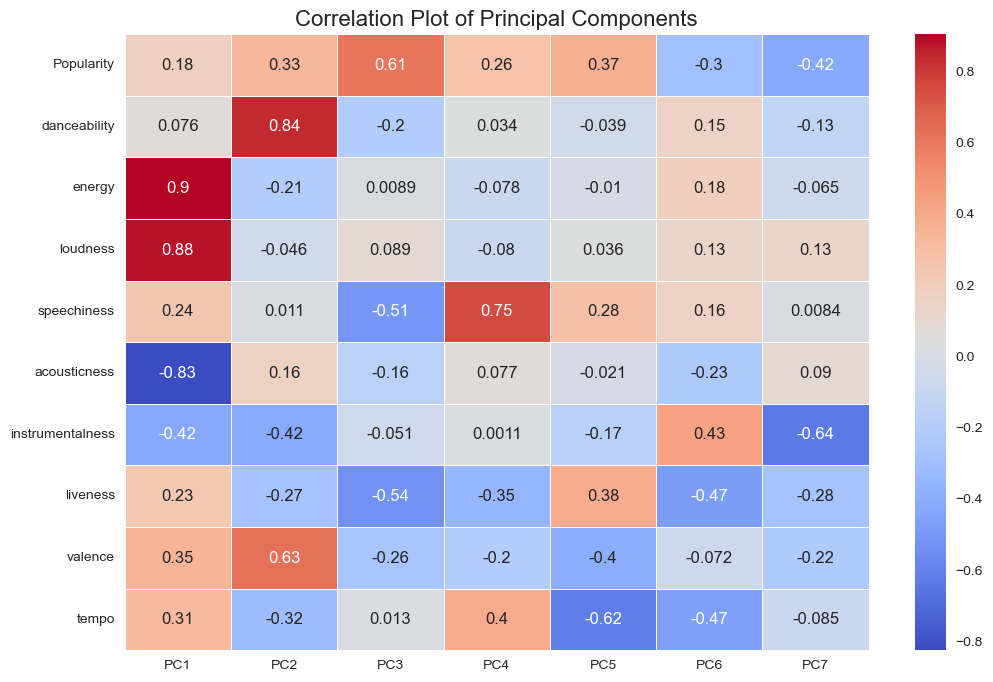

In [19]:
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Plot of Principal Components', fontsize=16)
plt.show()

In [20]:
df_pca_fit= pd.DataFrame(projected_data,columns=col)
df_pca_fit

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,0.893280,-0.041343,1.146611,-0.276160,0.022069,0.023804,0.250177
1,0.119385,-0.002514,-1.095369,-0.630490,-0.738570,-1.618423,0.040311
2,2.095447,-2.778109,0.422881,2.923931,0.008254,-0.950538,0.611146
3,2.353562,-1.867500,1.082416,0.843159,0.321895,-0.275221,0.732030
4,0.071370,1.309809,-0.212968,0.889691,-0.727382,-0.411571,0.072940
...,...,...,...,...,...,...,...
13301,-4.252716,-2.378755,0.312121,1.130740,-1.492080,-1.021832,-0.556001
13302,-2.709213,1.245178,-0.227859,-0.619654,0.513560,0.453037,1.600302
13303,1.714952,-1.048424,-1.449411,-1.464418,1.822326,-0.607988,-0.028450
13304,-0.521123,-2.772978,-0.776173,0.502301,-0.269237,1.108996,-1.376359


In [21]:
## Clustering

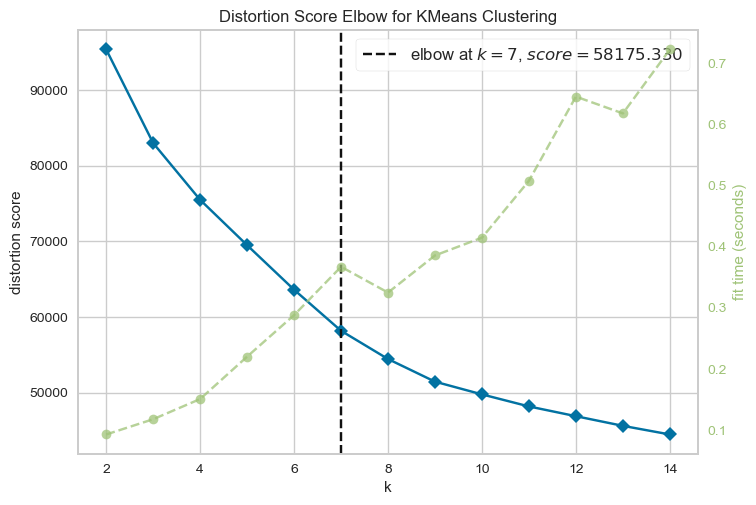

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [22]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

kmeans1 = KMeans()
visualizer = KElbowVisualizer(kmeans1, k=(2,15))
visualizer.fit(df_pca_fit)
visualizer.poof()

In [23]:
df2=df.copy()

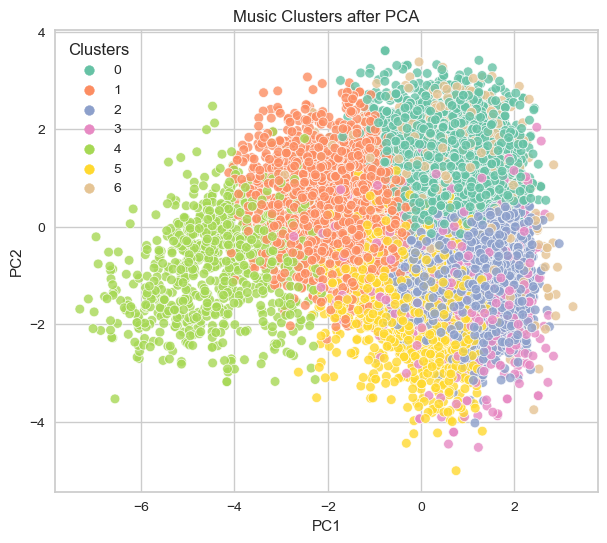

In [24]:
k_means_pca = KMeans(n_clusters = 7)
k_fit_pca = k_means_pca.fit(df_pca_fit)
centroids = k_fit_pca.cluster_centers_

pd.options.display.max_columns = 10
predictions = k_fit_pca.labels_

df_pca_fit['Clusters'] = predictions

plt.figure(figsize=(7,6))
sns.scatterplot(data=df_pca_fit, x='PC1', y='PC2', hue='Clusters', palette='Set2', alpha=0.8)
plt.title('Music Clusters after PCA');

In [25]:
df2['Clusters']=predictions

from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(df_pca_fit, df2['Clusters'])
print(f'Silhouette Score: {silhouette_avg}')

Silhouette Score: 0.30103299641175313


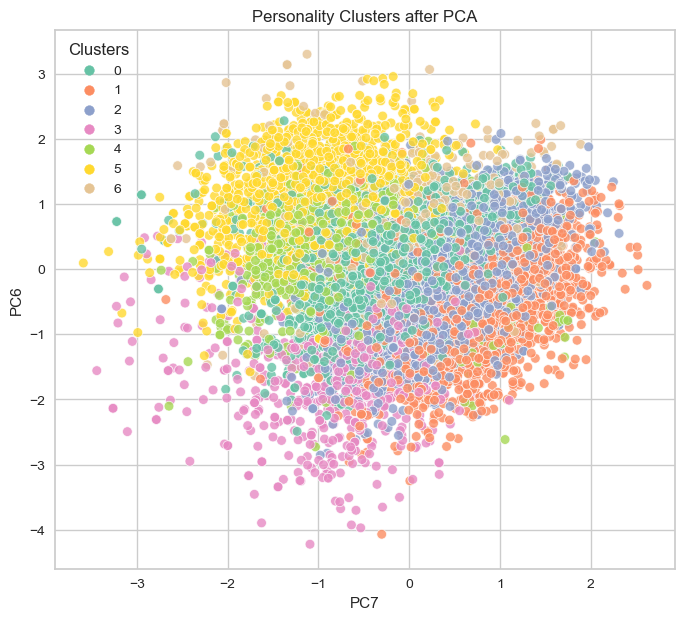

In [26]:
plt.figure(figsize=(8,7))
sns.scatterplot(data=df_pca_fit, x='PC7', y='PC6', hue='Clusters', palette='Set2', alpha=0.8)
plt.title('Personality Clusters after PCA');

## FACTOR ANALYSIS

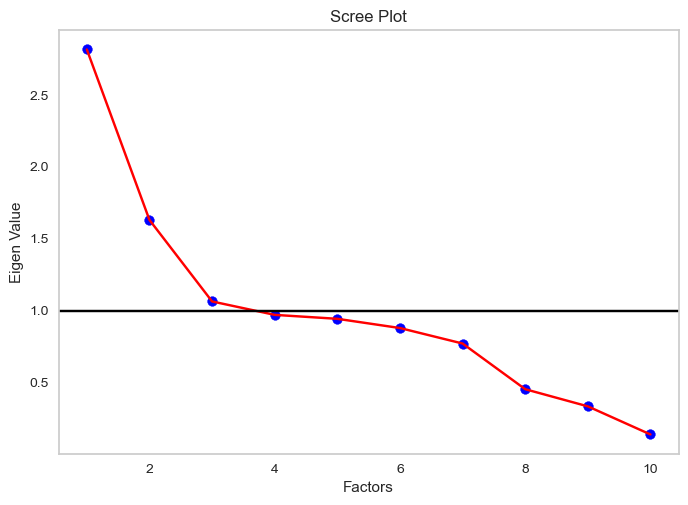

In [27]:
from factor_analyzer import FactorAnalyzer
n = data.shape[1]
fa = FactorAnalyzer(rotation = None,impute = "drop",n_factors=n)
fa.fit(data)
ev,_ = fa.get_eigenvalues()
plt.scatter(range(1,n+1),ev,color="blue",marker="o")

plt.plot(range(1,n+1),ev,color="red")
plt.axhline(1.0, color = 'black') #visualise which eigenvalues are above and below 1
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigen Value')
plt.grid()

In [28]:
# Set the number of factors based on the screeplot suggestion
nfactors = 3

# Create a factor analysis object with Varimax rotation
fa_1= FactorAnalyzer(rotation=None,n_factors=nfactors,method="principal",is_corr_matrix=False)

# Fit the factor analysis model to the correlation matrix
fa_1.fit(data)

factor_loadings_1 = pd.DataFrame(fa_1.loadings_, index=df.columns, columns=[f'FA{i + 1}' for i in range(nfactors)])
print("Factor Loadings:")
print(factor_loadings_1)

# Get factor variance in DataFrame form
factor_variance = pd.DataFrame(fa_1.get_factor_variance(), index=['SS Loadings', 'Proportion Var', 'Cumulative Var'],
                               columns=[f'FA{i + 1}' for i in range(nfactors)])
print("\nFactor Variance:")
print(factor_variance)

# Get communalities in DataFrame form
communalities = pd.DataFrame(fa_1.get_communalities(), index=df.columns, columns=['Communalities'])
print("\nCommunalities:")
print(communalities)

Factor Loadings:
                       FA1       FA2       FA3
Popularity        0.180662  0.333391 -0.611200
danceability      0.076237  0.838452  0.199385
energy            0.903452 -0.205910 -0.008858
loudness          0.878397 -0.046164 -0.089437
speechiness       0.243808  0.010727  0.508181
acousticness     -0.825245  0.163571  0.158504
instrumentalness -0.422848 -0.418772  0.051227
liveness          0.231076 -0.271567  0.537780
valence           0.347800  0.628878  0.258792
tempo             0.310079 -0.316851 -0.012657

Factor Variance:
                     FA1       FA2       FA3
SS Loadings     2.816039  1.630552  1.063733
Proportion Var  0.281604  0.163055  0.106373
Cumulative Var  0.281604  0.444659  0.551032

Communalities:
                  Communalities
Popularity             0.517353
danceability           0.748568
energy                 0.858704
loudness               0.781711
speechiness            0.317805
acousticness           0.732908
instrumentalness       0.356

In [29]:

fa_load_1 = pd.DataFrame(fa_1.loadings_,index=df.columns)
def highlight_max(s):
    # Get 5 largest values of the column
    is_large = s.nlargest(3).values
    # Apply style is the current value is among the 5 biggest values
    return ['background-color: yellow' if v in is_large else '' for v in s]

fa_load_1.sort_values(by=0,ascending=False).style.apply(highlight_max)

,0,1,2
energy,0.903452,-0.205910,-0.008858
loudness,0.878397,-0.046164,-0.089437
valence,0.347800,0.628878,0.258792
tempo,0.310079,-0.316851,-0.012657
speechiness,0.243808,0.010727,0.508181
liveness,0.231076,-0.271567,0.537780
Popularity,0.180662,0.333391,-0.611200
danceability,0.076237,0.838452,0.199385
instrumentalness,-0.422848,-0.418772,0.051227
acousticness,-0.825245,0.163571,0.158504


In [30]:
diagonal_matrix_1 = np.diagflat(np.array(1-communalities).flatten())
#diagonal_matrix_1
factor_loading_matrix_1 = factor_loadings_1.to_numpy()

# Calculate the product of the matrix with its transpose
covariance_estimate_1 = np.dot(factor_loading_matrix_1, factor_loading_matrix_1.T)+ diagonal_matrix_1

residual_matrix_1= df.corr()-covariance_estimate_1

print("**************Residual Matrix****************")
residual_matrix_1

**************Residual Matrix****************


,Popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
Popularity,0.000000,-0.029980,-0.040906,-0.093520,0.258671,0.067341,0.079657,0.300073,-0.057512,0.035623
danceability,-0.029980,0.000000,0.013361,0.030140,-0.025043,-0.079412,0.173614,-0.016553,-0.152855,0.060223
energy,-0.040906,0.013361,0.000000,-0.009516,-0.030676,0.021294,0.116936,-0.059331,0.036106,-0.120207
loudness,-0.093520,0.030140,-0.009516,0.000000,-0.040751,0.101982,0.015768,-0.044457,-0.067520,-0.109747
speechiness,0.258671,-0.025043,-0.030676,-0.040751,0.000000,0.018986,0.012539,-0.248854,-0.220331,0.024084
acousticness,0.067341,-0.079412,0.021294,0.101982,0.018986,0.000000,-0.116017,0.033359,0.015097,0.125257
instrumentalness,0.079657,0.173614,0.116936,0.015768,0.012539,-0.116017,0.000000,-0.089420,0.166963,-0.036608
liveness,0.300073,-0.016553,-0.059331,-0.044457,-0.248854,0.033359,-0.089420,0.000000,-0.028361,-0.112578
valence,-0.057512,-0.152855,0.036106,-0.067520,-0.220331,0.015097,0.166963,-0.028361,0.000000,0.152154
tempo,0.035623,0.060223,-0.120207,-0.109747,0.024084,0.125257,-0.036608,-0.112578,0.152154,0.000000


NameError: name 'Ellipse' is not defined

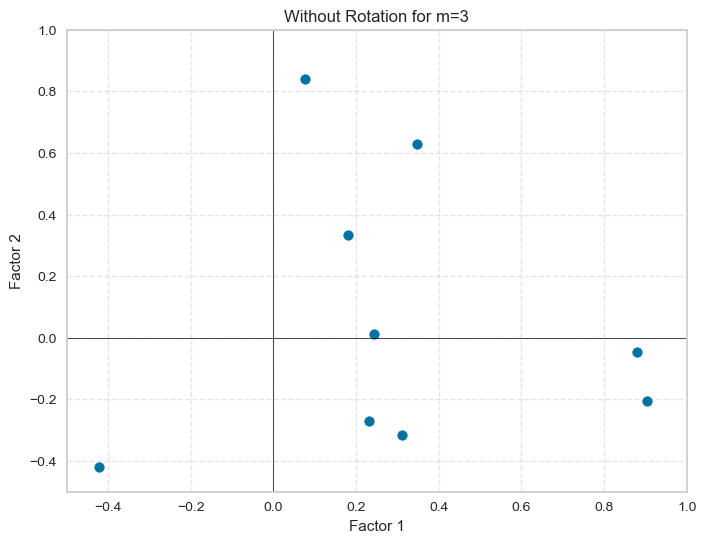

In [31]:
nfactors = 3

# Create a factor analysis object with Varimax rotation
fa_1= FactorAnalyzer(rotation=None,n_factors=nfactors,method="principal",is_corr_matrix=False)

# Fit the factor analysis model to the correlation matrix
fa_1.fit(df)

loadings_factor1 = fa_1.loadings_[:, 0]
loadings_factor2 = fa_1.loadings_[:, 1]

# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(loadings_factor1, loadings_factor2)
plt.xlim(-0.5, 1)
plt.ylim(-0.5, 1)
plt.xlabel('Factor 1')
plt.ylabel('Factor 2')
plt.title('Without Rotation for m=3')
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.grid(True, linestyle='--', alpha=0.5)

# Define a function to draw ellipses around clusters
def draw_ellipse(ax, center, width, height, angle, color, alpha):
    ellipse = Ellipse(xy=center, width=width, height=height, angle=angle, color=color, alpha=alpha)
    ax.add_patch(ellipse)

# Find and draw clusters
threshold = 0.2  # Adjust this threshold as needed
for i in range(len(loadings_factor1)):
    for j in range(i+1, len(loadings_factor2)):
        distance = np.sqrt((loadings_factor1[i] - loadings_factor1[j])**2 + (loadings_factor2[i] - loadings_factor2[j])**2)
        if distance < threshold:
            center = ((loadings_factor1[i] + loadings_factor1[j]) / 2, (loadings_factor2[i] + loadings_factor2[j]) / 2)
            width = np.abs(loadings_factor1[i] - loadings_factor1[j]) + 0.1
            height = np.abs(loadings_factor2[i] - loadings_factor2[j]) + 0.1
            angle = np.degrees(np.arctan2(loadings_factor2[j] - loadings_factor2[i], loadings_factor1[j] - loadings_factor1[i]))
            draw_ellipse(plt.gca(), center, width, height, angle, 'red', 0.1)

plt.show()


In [32]:
# Set the number of factors based on the screeplot suggestion
nfactors = 3

# Create a factor analysis object with Varimax rotation
fa_3= FactorAnalyzer(rotation="varimax",n_factors=nfactors,method="principal",is_corr_matrix=False)

# Fit the factor analysis model to the correlation matrix
fa_3.fit(df)

factor_loadings_3 = pd.DataFrame(fa_3.loadings_, index=df.columns, columns=[f'Factor{i + 1}' for i in range(nfactors)])
print("Factor Loadings:")
print(factor_loadings_3)

orthogonal_matrix_3 = fa_3.rotation_matrix_
print("\northogonal_matrix:")
print(orthogonal_matrix_3)


# Get factor variance in DataFrame form
factor_variance_3 = pd.DataFrame(fa_3.get_factor_variance(), index=['SS Loadings', 'Proportion Var', 'Cumulative Var'],
                               columns=[f'Factor{i + 1}' for i in range(nfactors)])
print("\nFactor Variance:")
print(factor_variance_3)

# Get communalities in DataFrame form
communalities_3 = pd.DataFrame(fa_3.get_communalities(), index=df.columns, columns=['Communalities'])
print("\nCommunalities:")
print(communalities_3)

Factor Loadings:
                   Factor1   Factor2   Factor3
Popularity        0.192817  0.217166 -0.658038
danceability     -0.200448  0.840617 -0.041849
energy            0.909570  0.098670  0.147140
loudness          0.856623  0.217767  0.022031
speechiness       0.130051  0.209593  0.506915
acousticness     -0.852520 -0.076596  0.015835
instrumentalness -0.290646 -0.507058  0.123337
liveness          0.191361 -0.046133  0.614495
valence           0.102457  0.749778  0.103732
tempo             0.382818 -0.194066  0.111770

orthogonal_matrix:
[[ 0.94120227  0.32045204 -0.10699894]
 [-0.27952875  0.91652766  0.28607819]
 [ 0.18974183 -0.23934817  0.95221347]]

Factor Variance:
                 Factor1   Factor2   Factor3
SS Loadings     2.660323  1.719818  1.130183
Proportion Var  0.266032  0.171982  0.113018
Cumulative Var  0.266032  0.438014  0.551032

Communalities:
                  Communalities
Popularity             0.517353
danceability           0.748568
energy            

In [33]:
fa_load_3 = pd.DataFrame(fa_3.loadings_,index=df.columns)
def highlight_max(s):
    # Get 5 largest values of the column
    is_large = s.nlargest(3).values
    # Apply style is the current value is among the 5 biggest values
    return ['background-color: yellow' if v in is_large else '' for v in s]

fa_load_3.sort_values(by=0,ascending=False).style.apply(highlight_max)

,0,1,2
energy,0.909570,0.098670,0.147140
loudness,0.856623,0.217767,0.022031
tempo,0.382818,-0.194066,0.111770
Popularity,0.192817,0.217166,-0.658038
liveness,0.191361,-0.046133,0.614495
speechiness,0.130051,0.209593,0.506915
valence,0.102457,0.749778,0.103732
danceability,-0.200448,0.840617,-0.041849
instrumentalness,-0.290646,-0.507058,0.123337
acousticness,-0.852520,-0.076596,0.015835


In [34]:
diagonal_matrix_3 = np.diagflat(np.array(1-communalities_3).flatten())
#diagonal_matrix_2

factor_loading_matrix_3 = factor_loadings_3.to_numpy()

# Calculate the product of the matrix with its transpose
covariance_estimate_3 = np.dot(factor_loading_matrix_3, factor_loading_matrix_3.T)+ diagonal_matrix_3

residual_matrix_3= df.corr()-covariance_estimate_3
print("**************Residual Matrix****************")
(residual_matrix_3)

**************Residual Matrix****************


,Popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
Popularity,0.000000,-0.029980,-4.090564e-02,-0.093520,0.258671,0.067341,0.079657,0.300073,-0.057512,0.035623
danceability,-0.029980,0.000000,1.336062e-02,0.030140,-0.025043,-0.079412,0.173614,-0.016553,-0.152855,0.060223
energy,-0.040906,0.013361,1.110223e-16,-0.009516,-0.030676,0.021294,0.116936,-0.059331,0.036106,-0.120207
loudness,-0.093520,0.030140,-9.516241e-03,0.000000,-0.040751,0.101982,0.015768,-0.044457,-0.067520,-0.109747
speechiness,0.258671,-0.025043,-3.067562e-02,-0.040751,0.000000,0.018986,0.012539,-0.248854,-0.220331,0.024084
acousticness,0.067341,-0.079412,2.129433e-02,0.101982,0.018986,0.000000,-0.116017,0.033359,0.015097,0.125257
instrumentalness,0.079657,0.173614,1.169357e-01,0.015768,0.012539,-0.116017,0.000000,-0.089420,0.166963,-0.036608
liveness,0.300073,-0.016553,-5.933092e-02,-0.044457,-0.248854,0.033359,-0.089420,0.000000,-0.028361,-0.112578
valence,-0.057512,-0.152855,3.610556e-02,-0.067520,-0.220331,0.015097,0.166963,-0.028361,0.000000,0.152154
tempo,0.035623,0.060223,-1.202065e-01,-0.109747,0.024084,0.125257,-0.036608,-0.112578,0.152154,0.000000


In [35]:
print("\nFactor Variance:")
print(factor_variance_3)



Factor Variance:
                 Factor1   Factor2   Factor3
SS Loadings     2.660323  1.719818  1.130183
Proportion Var  0.266032  0.171982  0.113018
Cumulative Var  0.266032  0.438014  0.551032


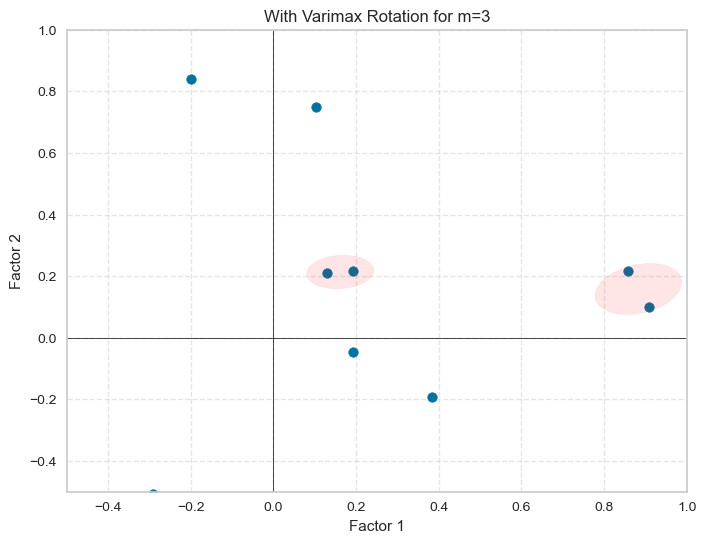

In [36]:
from matplotlib.patches import Ellipse

fa_3= FactorAnalyzer(rotation="varimax",n_factors=nfactors,method="principal",is_corr_matrix=False)
# Fit the factor analysis model to the correlation matrix
fa_3.fit(df)

loadings_factor1 = fa_3.loadings_[:, 0]
loadings_factor2 = fa_3.loadings_[:, 1]

# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(loadings_factor1, loadings_factor2)
plt.xlim(-0.5, 1)
plt.ylim(-0.5, 1)
plt.xlabel('Factor 1')
plt.ylabel('Factor 2')
plt.title('With Varimax Rotation for m=3')
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.grid(True, linestyle='--', alpha=0.5)

# Define a function to draw ellipses around clusters
def draw_ellipse(ax, center, width, height, angle, color, alpha):
    ellipse = Ellipse(xy=center, width=width, height=height, angle=angle, color=color, alpha=alpha)
    ax.add_patch(ellipse)

# Find and draw clusters
threshold = 0.2  # Adjust this threshold as needed
for i in range(len(loadings_factor1)):
    for j in range(i+1, len(loadings_factor2)):
        distance = np.sqrt((loadings_factor1[i] - loadings_factor1[j])**2 + (loadings_factor2[i] - loadings_factor2[j])**2)
        if distance < threshold:
            center = ((loadings_factor1[i] + loadings_factor1[j]) / 2, (loadings_factor2[i] + loadings_factor2[j]) / 2)
            width = np.abs(loadings_factor1[i] - loadings_factor1[j]) + 0.1
            height = np.abs(loadings_factor2[i] - loadings_factor2[j]) + 0.1
            angle = np.degrees(np.arctan2(loadings_factor2[j] - loadings_factor2[i], loadings_factor1[j] - loadings_factor1[i]))
            draw_ellipse(plt.gca(), center, width, height, angle, 'red', 0.1)

plt.show()


In [37]:
eigenvalues, eigenvectors = np.linalg.eig(corr)

sorted_indices = np.argsort(eigenvalues)[::-1]  # Sort in descending order
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# Calculate the explained variance ratio
explained_variance_ratio = eigenvalues / np.sum(eigenvalues)

total_variance = np.sum(explained_variance_ratio)
variance_to_retain = 0.90
cumulative_variance = np.cumsum(explained_variance_ratio)

In [38]:
# Create a DataFrame to hold the table
dt = {'Principal Component': ['PC{}'.format(i) for i in range(1, len(eigenvalues) + 1)],
        'Eigenvalues': eigenvalues,
        'Proportion': explained_variance_ratio,
        'Cumulative': cumulative_variance}

df_table = pd.DataFrame(dt)

# Display the table
df_table


,Principal Component,Eigenvalues,Proportion,Cumulative
0,PC1,2.816039,0.281604,0.281604
1,PC2,1.630552,0.163055,0.444659
2,PC3,1.063733,0.106373,0.551032
3,PC4,0.970426,0.097043,0.648075
4,PC5,0.942988,0.094299,0.742374
5,PC6,0.878838,0.087884,0.830258
6,PC7,0.771099,0.077110,0.907368
7,PC8,0.453481,0.045348,0.952716
8,PC9,0.334172,0.033417,0.986133
9,PC10,0.138671,0.013867,1.000000


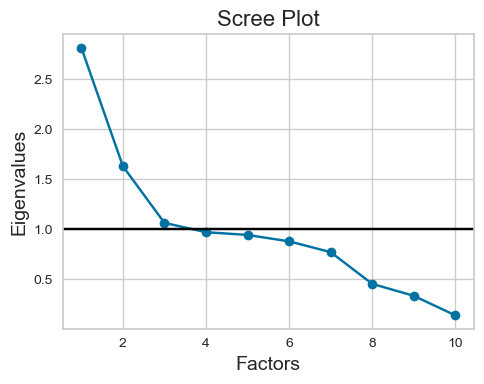

In [39]:
import matplotlib.pyplot as plt
import numpy as np

# Create a scree plot
plt.figure(figsize=(5, 4))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', linestyle='-')
plt.title('Scree Plot', fontsize=16)
plt.xlabel('Factors', fontsize=14)
plt.ylabel('Eigenvalues', fontsize=14)

plt.axhline(1.0, color = 'black') #visualise which eigenvalues are above and below 1

# Show the scree plot
plt.grid(True)
plt.tight_layout()
plt.show()


In [40]:
from factor_analyzer import FactorAnalyzer
fa = FactorAnalyzer(n_factors=3,rotation=None)
fa.fit(data)

FactorAnalyzer(rotation=None, rotation_kwargs={})

In [41]:
fa.get_communalities()

array([0.04202088, 1.01368493, 0.9955632 , 0.68433544, 0.03171853,
       0.59061808, 0.99656513, 0.04224886, 0.24048509, 0.07633978])

In [42]:
print(pd.DataFrame(fa.get_factor_variance(),index=['Variance','Proportional Var','Cumulative Var'],columns=['FA1','FA2','FA3']))

                       FA1       FA2       FA3
Variance          2.546362  1.400686  0.766532
Proportional Var  0.254636  0.140069  0.076653
Cumulative Var    0.254636  0.394705  0.471358


In [43]:
fa_load = pd.DataFrame(fa.loadings_,index=df.columns,columns=['FA1','FA2','FA3'])

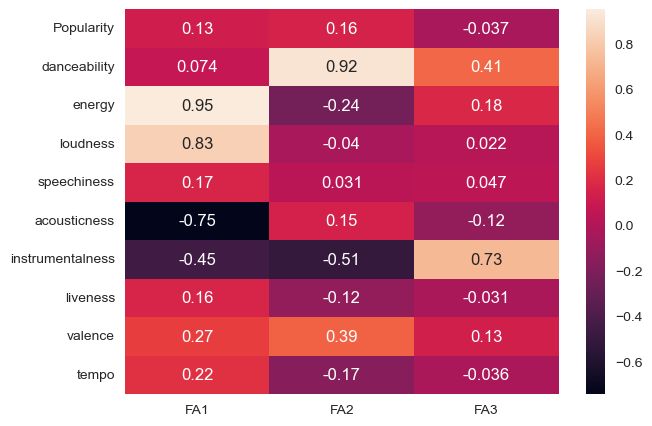

In [44]:
plt.figure(figsize=(7,5))
sns.heatmap(fa_load,annot=True)
plt.show()

In [45]:
df_fa_fit=pd.DataFrame(fa.transform(data),columns=['FA1','FA2','FA3'])
df_fa_fit

,FA1,FA2,FA3
0,0.601942,-0.656251,-0.865453
1,-0.190638,-0.178133,-0.990681
2,1.133988,-1.863935,-1.313563
3,1.173578,-1.578823,-1.123271
4,0.215227,1.002576,0.033249
...,...,...,...
13301,-2.875203,-2.031221,-0.282238
13302,-1.442529,1.186521,-0.864706
13303,1.373862,0.181222,0.191203
13304,-0.405369,-2.642117,1.241596


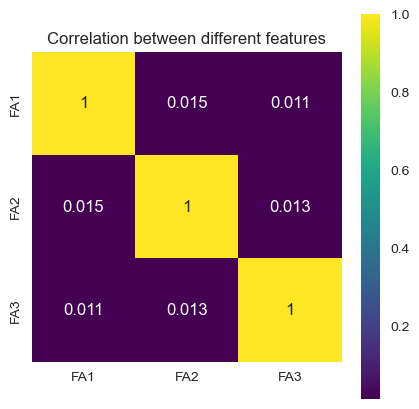

In [46]:
plt.figure(figsize=(5,5))
sns.heatmap(df_fa_fit.corr(), vmax=1, square=True, annot=True, cmap='viridis')
plt.title('Correlation between different features')
plt.show()

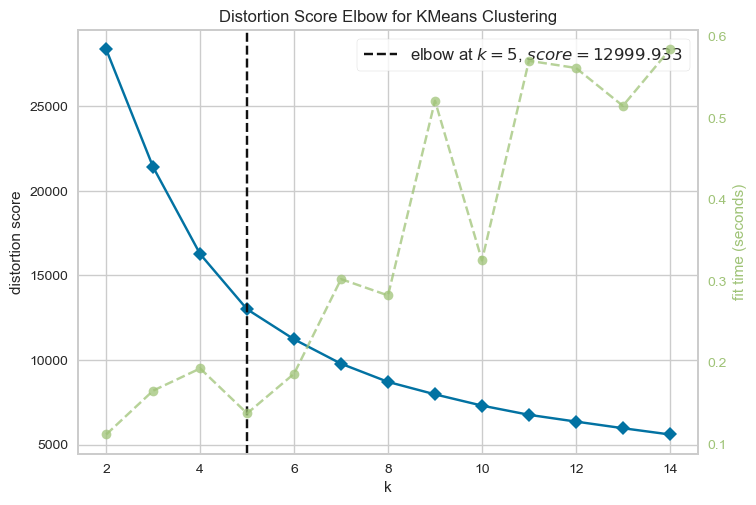

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [47]:
kmeans2 = KMeans()
visualizer1 = KElbowVisualizer(kmeans2, k=(2,15))
visualizer1.fit(df_fa_fit)
visualizer1.poof()

In [48]:
k_means_fa= KMeans(n_clusters = 5)
k_fit_fa = k_means_fa.fit(df_fa_fit)
centroids1 = k_fit_fa.cluster_centers_

pd.options.display.max_columns = 10
predictions1 = k_fit_fa.labels_
df_fa_fit['Clusters'] = predictions1
df_fa_fit.head()

,FA1,FA2,FA3,Clusters
0,0.601942,-0.656251,-0.865453,4
1,-0.190638,-0.178133,-0.990681,0
2,1.133988,-1.863935,-1.313563,4
3,1.173578,-1.578823,-1.123271,4
4,0.215227,1.002576,0.033249,1


In [49]:
df2['Clusters'] = predictions1
df2.head()

,Popularity,danceability,energy,loudness,speechiness,...,instrumentalness,liveness,valence,tempo,Clusters
1,54.0,0.382,0.814,-7.230,0.0406,...,0.004010,0.1010,0.5690,116.454,4
2,35.0,0.434,0.614,-8.334,0.0525,...,0.000196,0.3940,0.7870,147.681,0
4,53.0,0.167,0.975,-4.279,0.2160,...,0.016100,0.1720,0.0918,199.060,4
5,53.0,0.235,0.977,0.878,0.1070,...,0.006040,0.1720,0.2410,152.952,4
6,48.0,0.674,0.658,-9.647,0.1040,...,0.000001,0.0981,0.6770,143.292,1


In [50]:
df2.groupby('Clusters').mean()

,Popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
Clusters,,,,,,,,,,
0,41.146870,0.491547,0.392372,-11.117440,0.053457,0.531717,0.031208,0.175937,0.394158,117.616008
1,46.708659,0.697012,0.679711,-7.484277,0.076455,0.199931,0.040438,0.177121,0.610748,117.964343
2,38.255543,0.401675,0.216592,-17.299180,0.047448,0.783056,0.819427,0.138276,0.232231,108.952247
3,37.547375,0.496072,0.785393,-7.572139,0.069364,0.114903,0.741690,0.204753,0.440454,127.167134
4,44.041023,0.423912,0.856165,-5.758230,0.078396,0.057203,0.044530,0.232464,0.450743,131.606322


In [51]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(df_fa_fit, df2['Clusters'])
print(f'Silhouette Score: {silhouette_avg}')

Silhouette Score: 0.5306059951938178


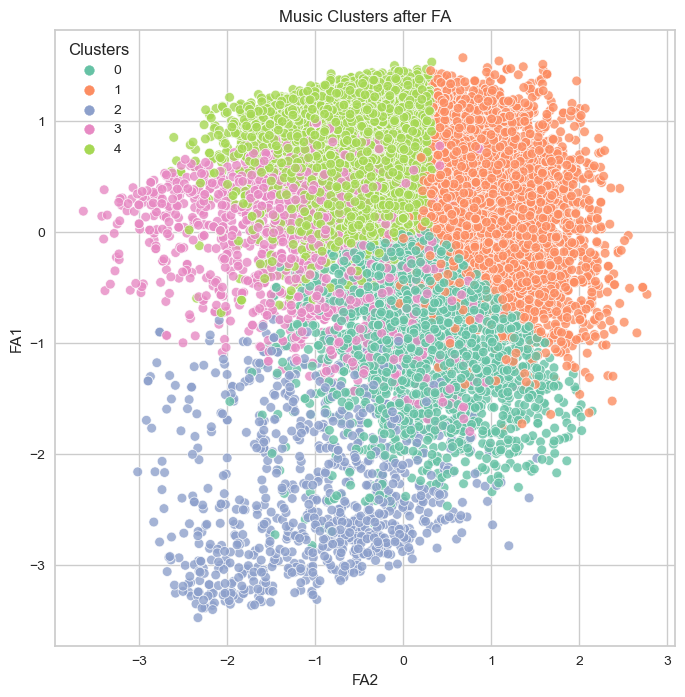

In [52]:
plt.figure(figsize=(8,8))
sns.scatterplot(data=df_fa_fit, x='FA2' , y='FA1' , hue='Clusters', palette='Set2', alpha=0.8)
plt.title('Music Clusters after FA');

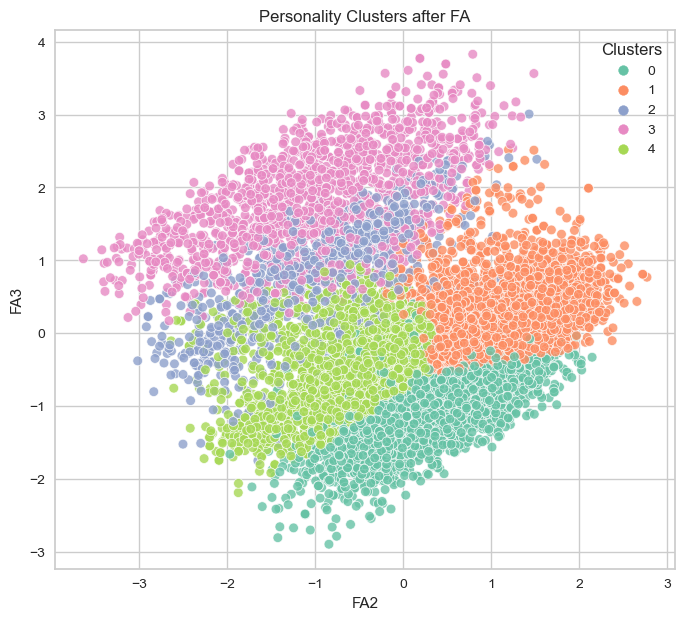

In [53]:
plt.figure(figsize=(8,7))
sns.scatterplot(data=df_fa_fit, x='FA2' , y='FA3' , hue='Clusters', palette='Set2', alpha=0.8)
plt.title('Personality Clusters after FA');

In [54]:
df_fa_fit

,FA1,FA2,FA3,Clusters
0,0.601942,-0.656251,-0.865453,4
1,-0.190638,-0.178133,-0.990681,0
2,1.133988,-1.863935,-1.313563,4
3,1.173578,-1.578823,-1.123271,4
4,0.215227,1.002576,0.033249,1
...,...,...,...,...
13301,-2.875203,-2.031221,-0.282238,2
13302,-1.442529,1.186521,-0.864706,0
13303,1.373862,0.181222,0.191203,4
13304,-0.405369,-2.642117,1.241596,3


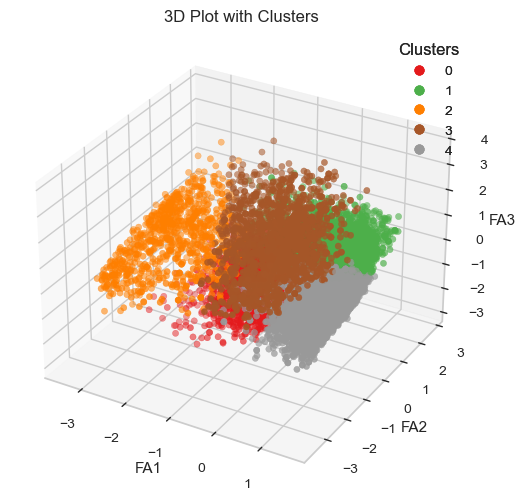

In [55]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter=ax.scatter(df_fa_fit['FA1'], df_fa_fit['FA2'], df_fa_fit['FA3'], c=df_fa_fit['Clusters'], cmap=plt.cm.Set1,marker='o')

# Set axis labels
ax.set_xlabel('FA1')
ax.set_ylabel('FA2')
ax.set_zlabel('FA3')

# Set plot title
ax.set_title('3D Plot with Clusters')

# Add a colorbar to show cluster assignments
legend = ax.legend(*scatter.legend_elements(),  title='Clusters')
ax.add_artist(legend)
# Show the plot
plt.show()


In [56]:
import plotly.express as px
fig = px.scatter_3d(df_fa_fit, x='FA1', y='FA2', z='FA3', color='Clusters', 
                    title='3D Plot with Clusters', opacity=0.7)

# Show the interactive plot
fig.show()

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram

complete_clustering = linkage(df_fa_fit, method="complete", metric="euclidean", optimal_ordering=True,)
average_clustering = linkage(df_fa_fit, method="average", metric="euclidean",optimal_ordering=True)
single_clustering = linkage(df_fa_fit, method="single", metric="euclidean",optimal_ordering=True)

In [ ]:
dendrogram(complete_clustering)
plt.axhline(y=11.8, color='black', linestyle='--', linewidth=1)
plt.axhline(y=13.5, color='black', linestyle='--', linewidth=1)
plt.title("complete_linkage_clustering")
plt.show()

In [ ]:
dendrogram(single_clustering)
plt.axhline(y=6.55, color='black', linestyle='--', linewidth=1)
plt.axhline(y=4.5,color='black', linestyle='--', linewidth=1)
plt.title("single_linkage_clustering")
plt.show()